# Flow Estimation

If you are running on Colab,
* Go to runtime -> change runtime type -> select "GPU" as the hardware accelerator. 

## Having Fun with Optical Flow

### ARFlow

Download the code for ARFlow from this link and install the requirements as recommended: https://github.com/lliuz/ARFlow

Make sure that you can run the inference.py without a problem before the next part.

If you could not install ARFlow on your local machine, you can follow these steps either on Colab or on your own machine to make it work:

Download the repository:

In [1]:
!wget https://github.com/lliuz/ARFlow/archive/master.zip

--2022-06-04 14:36:58--  https://github.com/lliuz/ARFlow/archive/master.zip
Resolving github.com (github.com)... 140.82.114.3
Connecting to github.com (github.com)|140.82.114.3|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://codeload.github.com/lliuz/ARFlow/zip/refs/heads/master [following]
--2022-06-04 14:36:59--  https://codeload.github.com/lliuz/ARFlow/zip/refs/heads/master
Resolving codeload.github.com (codeload.github.com)... 140.82.113.9
Connecting to codeload.github.com (codeload.github.com)|140.82.113.9|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [application/zip]
Saving to: ‘master.zip’

master.zip              [            <=>     ]  75.68M  15.2MB/s    in 5.0s    

2022-06-04 14:37:04 (15.2 MB/s) - ‘master.zip’ saved [79359531]



Unzip the repository:

In [2]:
!unzip master.zip

Archive:  master.zip
e92a8bbe66f0ced244267f43e3e55ad0fe46ff3e
   creating: ARFlow-master/
 extracting: ARFlow-master/.gitignore  
  inflating: ARFlow-master/Dockerfile  
  inflating: ARFlow-master/LICENSE   
  inflating: ARFlow-master/README.md  
  inflating: ARFlow-master/basic_train.py  
   creating: ARFlow-master/checkpoints/
   creating: ARFlow-master/checkpoints/CityScapes/
  inflating: ARFlow-master/checkpoints/CityScapes/pwclite_ar.tar  
   creating: ARFlow-master/checkpoints/KITTI12/
  inflating: ARFlow-master/checkpoints/KITTI12/pwclite_ar.tar  
  inflating: ARFlow-master/checkpoints/KITTI12/pwclite_ar_mv.tar  
   creating: ARFlow-master/checkpoints/KITTI15/
  inflating: ARFlow-master/checkpoints/KITTI15/pwclite_ar.tar  
  inflating: ARFlow-master/checkpoints/KITTI15/pwclite_ar_mv.tar  
  inflating: ARFlow-master/checkpoints/KITTI15/pwclite_raw.tar  
   creating: ARFlow-master/checkpoints/Sintel/
  inflating: ARFlow-master/checkpoints/Sintel/pwclite_ar.tar  
  inflating: ARFlo

Navigate to the repository:

In [3]:
cd ARFlow-master/

/content/ARFlow-master


From the menu on the left, open `models/pwclite.py` file, comment the 6th line and uncomment the 7th line.
Then, **if you are using Colab you should not run the next cell**. but if you are on your local machine, install the requirements:

In [ ]:
!pip3 install -r requirements.txt

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 676.9 MB 3.7 kB/s 
     |████████████████████████████████| 2.6 MB 52.4 MB/s 
     |████████████████████████████████| 58.2 MB 1.2 MB/s 
     |████████████████████████████████| 47 kB 5.0 MB/s 
     |████████████████████████████████| 125 kB 44.1 MB/s 
  Created wheel for fast-slic: filename=fast_slic-0.4.0-cp37-cp37m-linux_x86_64.whl size=1708428 sha256=e14a2695be491cfb9bd9c0aadd15f23e2098e7d6dc1d57520fed3e20fcbf041e
  Stored in directory: /root/.cache/pip/wheels/82/da/40/defa5d67d0c67e74936d0ab2f619e8b0b4dc6abcca8c1eaeb1
Successfully built fast-slic
  Attempting uninstall: torch
    Found existing installation: torch 1.11.0+cu113
    Uninstalling torch-1.11.0+cu113:
      Successfully uninstalled torch-1.11.0+cu113
  Attempting uninstall: torchvision
    Found existing installation: torchvision 0.12.0+cu113
    Uninstalling torchvision-0.12.0+cu113:
 

Now you should be able to run the following:

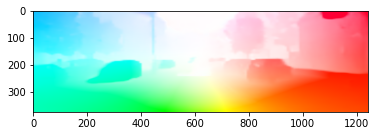

In [4]:
%run inference.py -m checkpoints/KITTI15/pwclite_ar.tar -s 384 640  -i examples/img1.png examples/img2.png

### Bullet Time Effect

In this question, you will estimate optical flow using ARFlow (or you can use some other flow method if you cannot make it work) and then use it to interpolate between two images. 

First, calculate the optical flow between two images, e.g. provided KITTI images in the example folder, using the ARFlow as illustrated by the example in inference.py. 
Then, synthesize 10 novel frames between the two images using linear interpolation. 

**Hint:** First, compute the flow and then divide it by the number of frames. Then, at each step, warp the image incrementally to obtain images in between. You can use OpenCV's `remap()` function for warping or have a look at the `flow_warp` in utils/warp_utils.py file of the ARFlow.

* Where does the interpolation work well and where does it fail? 
* Please also hand-in your interpolated images or create a small movie.


---
## Implementation:

#### Add the following 2 lines of code to inference.py's 69^th line :
```python
# save the calculated flow values
h, w, d = np_flow_12.shape[0], np_flow_12.shape[1], np_flow_12.shape[2]
np.savetxt("../saved_np_flow.txt", np_flow_12.reshape(h, w*d)) # save to txt (reshape 3D array to 2D for saving)
```

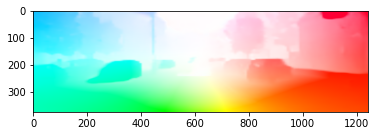

In [5]:
# Save Flow values in into "saved_np_flow.txt" file by running this cell
%run inference.py -m checkpoints/KITTI15/pwclite_ar.tar -s 384 640  -i examples/img1.png examples/img2.png

In [6]:
import numpy as np
# Read in the saved flow values
flow_np = np.loadtxt('/content/saved_np_flow.txt')
# reshape 2D array to 3D optical flow where [H, W, 2(vector)]
flow_np = flow_np.reshape(flow_np.shape[0], -1, 2)
H, W = flow_np.shape[0], flow_np.shape[1]
print("Calculated Optical Flow shape: ", flow_np.shape)

Calculated Optical Flow shape:  (375, 1242, 2)


In [7]:
# calculate intermediary flow values
num_frames = 10 # number of novel frames to synthesize

delta_flow = flow_np / num_frames # amount to change at every frame

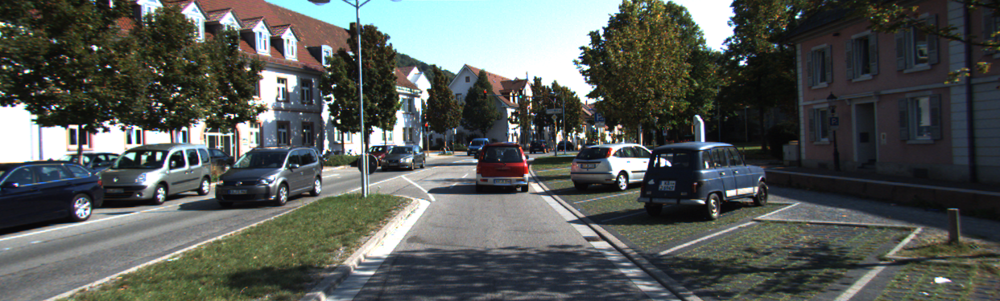

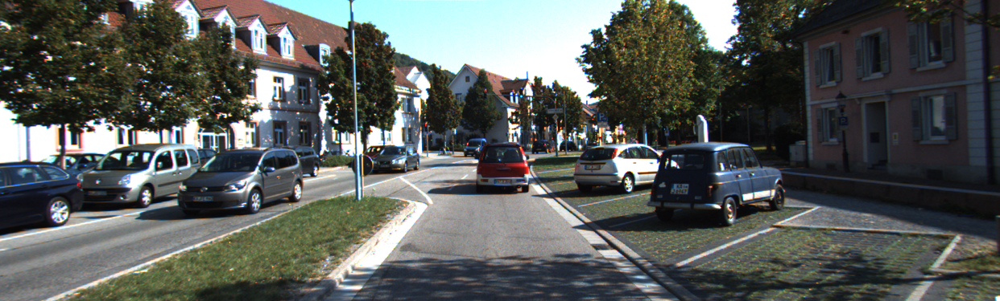

In [8]:
import cv2
from google.colab.patches import cv2_imshow
import os
# Read in the original 2 images
base_dir = "/content/ARFlow-master/examples"
img1_name = "img1.png"
img2_name = "img2.png"

original_img1 = cv2.imread(os.path.join(base_dir, img1_name))
original_img2 = cv2.imread(os.path.join(base_dir, img2_name))

cv2_imshow(original_img1)
cv2_imshow(original_img2)

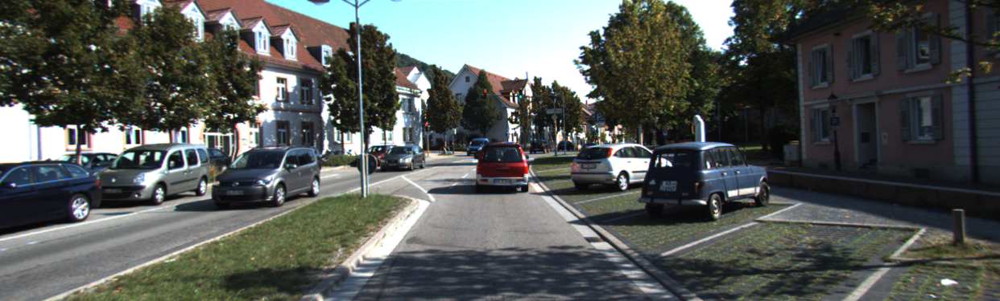

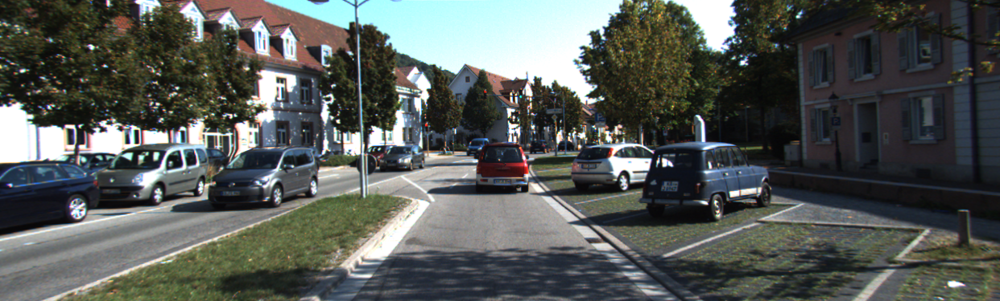

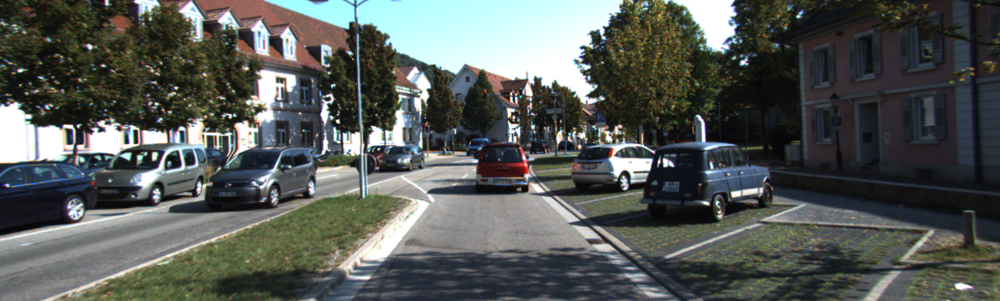

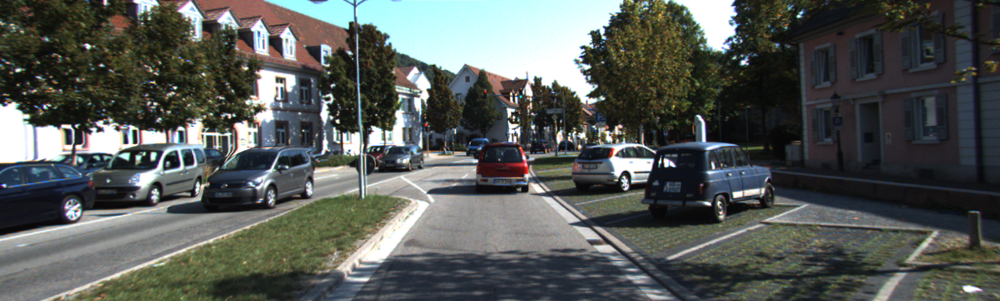

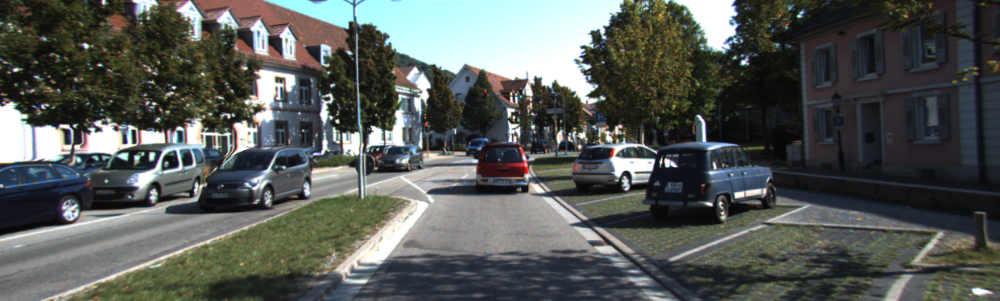

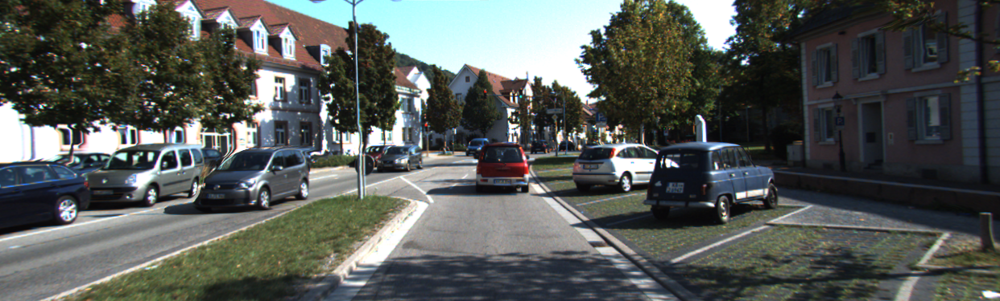

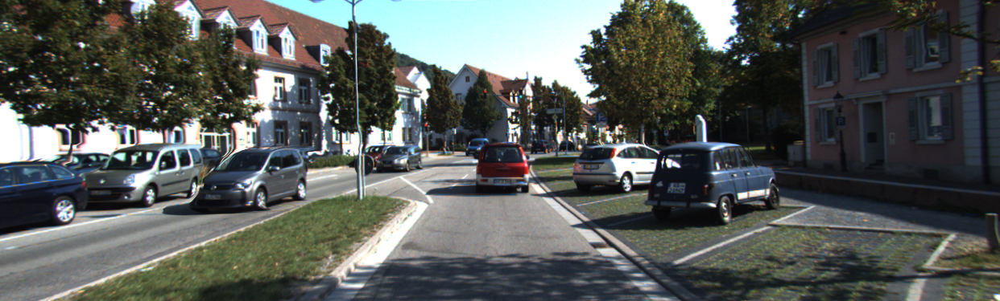

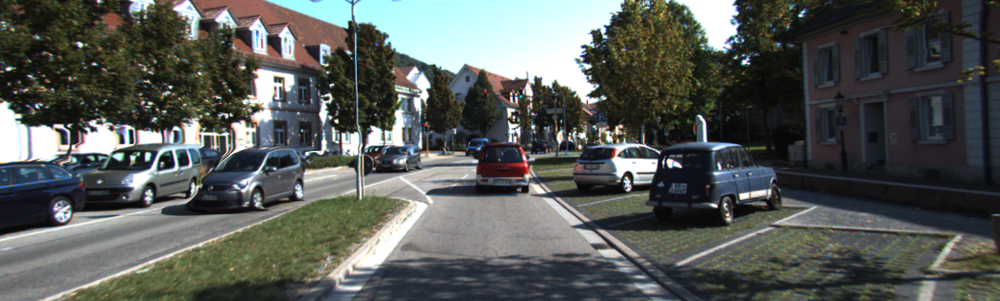

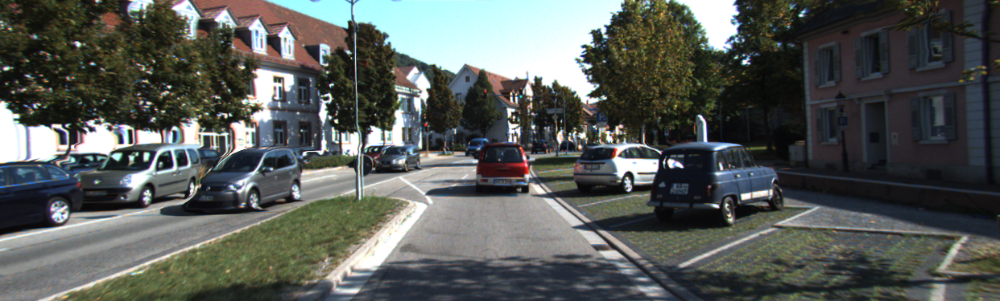

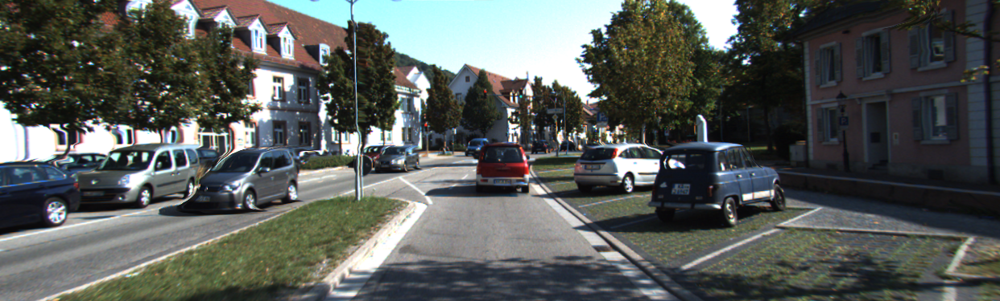

Synthesized 10 images are saved to "/content/results"!


In [13]:
import os

# create a folder to save synthesized images
save_dir = "/content/results"
if not os.path.exists(save_dir):
  os.makedirs(save_dir)

# Rewarp the images
row_indices = np.expand_dims(np.arange(W), axis=0) # --> [1, W]
map_x = np.repeat(row_indices, H, axis=0).astype(np.float32) # --> [H, W]

column_indices = np.expand_dims(np.arange(H), axis=1) # --> [H, 1]
map_y = np.repeat(column_indices, W, axis=1).astype(np.float32) # --> [H, W]


# apply delta flow
for i in range(num_frames):
  # if i == 0:
  #   mapped_img = original_img1

  map_x -= delta_flow[:,:,0]
  map_y -= delta_flow[:,:,1]

  mapped_img = cv2.remap(original_img1, map_x, map_y, cv2.INTER_LINEAR)
  
  cv2_imshow(mapped_img)
  # Saving the image
  cv2.imwrite(os.path.join(save_dir, str(i)) + ".jpg", mapped_img)

print(f"Synthesized {num_frames} images are saved to \"{save_dir}\"!")

### Multi-frame Bullet Time Sequence (Optional)

If you had fun with the previous question, you might want to extend this effect to several frames as in the original Matrix movie! 

Use consecutive images or capture several images along a smooth camera trajectory and smoothly vary the pose of the objects in between. 

Between each two adjacent frames, interpolate an additional 10 to 100 frames and concatenate all images to one long slow motion video sequence.